In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.integrate import quad
import torch

from copy import deepcopy

import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np

### Add mbt-gym to path

In [2]:
import sys
sys.path.append("../")
from mbt_gym.gym.ModelDynamics import LimitOrderModelDynamics
from mbt_gym.agents.BaselineAgents import *
from mbt_gym.stochastic_processes.midprice_models import *
from mbt_gym.stochastic_processes.arrival_models import *
from mbt_gym.stochastic_processes.fill_probability_models import *

# helpers
from mbt_gym.gym.TradingEnvironment import TradingEnvironment
from mbt_gym.gym.StableBaselinesTradingEnvironment import StableBaselinesTradingEnvironment
from mbt_gym.gym.index_names import *
from mbt_gym.gym.helpers.plotting import *
from mbt_gym.gym.helpers.generate_trajectory import generate_trajectory
from mbt_gym.gym.wrappers import *

### Add MM Fads path

In [3]:
import sys
sys.path.append("../") # This version of the notebook is in the subfolder "notebooks" of the repo

import gym
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.integrate import quad

from copy import deepcopy


from mbt_gym.agents.BaselineAgents import *
from mbt_gym.gym.TradingEnvironment import TradingEnvironment
from mbt_gym.gym.helpers.generate_trajectory import generate_trajectory
from mbt_gym.gym.helpers.plotting import *
from mbt_gym.stochastic_processes.midprice_models import *
from mbt_gym.stochastic_processes.arrival_models import *
from mbt_gym.stochastic_processes.fill_probability_models import *
import torch
#print(torch.cuda.is_available())
#print(torch.cuda.get_device_name())
from mbt_gym.gym.ModelDynamics import LimitOrderModelDynamics
seed = 42


In [4]:
from mbt_gym.stochastic_processes.midprice_models import ArithmeticBrownianMotionWithFadsMidpriceModel

In [5]:
# Notebook for the paper: MM with informed and uninformed traders
import pickle

with open('MM_Fads_Adrien/params_env.pkl', 'rb') as f:
    params_env = pickle.load(f)    
import numpy as np
from scipy.linalg import expm
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (8, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)
%config InlineBackend.figure_format = "retina"

import matplotlib

import MM_Fads_Adrien.utils as utils
from importlib import reload
mm = utils.mm_with_fads(**params_env)

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


In [6]:
print(params_env)

{'k': 1, 'phi': 0.1, 'alpha': 0.001, 'q_bar': 50, 'T': 1, 'N_t': 1000, 'N_u': 100, 'U_max': 10, 'sigma': 1, 'eta': 10, 'qconst': 0.6, 'mu': 0, 'Q_0': 0, 'X_0': 0, 'S_0': 100, 'U_0': 0, 'varphi': 15, 'total_arrivals': 30, 'gamma': 1, 'matrixCJ': []}


### Parameters

In [7]:
max_inventory = 50

seed = 42

In [8]:
initial_price = 100
terminal_time = 1.0
sigma = 1.0
n_steps = 1000
initial_inventory = 0
fads_proportion = 0.6 # p is defined directly inside the ArithmeticBrownianMotionWithFadsMidpriceModel class as sqrt(1-q^2)
eta = 10
phi = 15
k = 1
fill_exponent = k
gamma = k
alpha=0.001
mu=0
big_phi=0.1

In [9]:
# OU parameters
u0 = 0.0
xi = 1.0

def m(t):
    return u0 * np.exp(-eta * t)

def v(t):
    return (xi**2) / (2.0 * eta) * (1.0 - np.exp(-2.0 * eta * t))

def compute_psi(q):
    c = gamma * sigma * q
    def integrand(t):
        return np.exp(c * m(t) + 0.5 * (c**2) * v(t))
    denom, _ = quad(integrand, 0.0, terminal_time)
    return (30.0 - phi * terminal_time) / denom

# compute psi for each fad proportion
psi = compute_psi(fads_proportion)

print("psi value:", psi)

psi value: 14.872283180889763


In [10]:
def get_as_env(num_trajectories:int = 1, fads_proportion:float=0.6, 
               psi:float = 15.0, phi:float = 15.0, eta:float = 10.0,
               gamma:float = 1.0, n_steps:int = 1000, initial_price:float = 100.0,
               ) -> TradingEnvironment:
    midprice_model = ArithmeticBrownianMotionWithFadsMidpriceModel(initial_price=initial_price, drift=mu,
                                                 volatility=sigma, fads_proportion=fads_proportion, eta=eta, step_size=terminal_time/n_steps,
                                                 terminal_time=terminal_time,
                                                 num_trajectories=num_trajectories, seed=seed)
    arrival_model = ModifiedPoissonArrivalModel(phi=phi,
                                                psi=psi,
                                                gamma=gamma,
                                                fads_proportion=fads_proportion,
                                                sigma=sigma,
                                                step_size=terminal_time/n_steps,
                                                num_trajectories=num_trajectories,
                                                seed=seed)
    fill_probability_model = ExponentialFillFunction(fill_exponent=k, 
                                                     step_size=terminal_time/n_steps,
                                                     num_trajectories=num_trajectories,
                                                     seed=seed)
    LOtrader = LimitOrderModelDynamics(midprice_model = midprice_model, arrival_model = arrival_model, 
                                fill_probability_model = fill_probability_model,
                                num_trajectories = num_trajectories, seed=seed)
    reward = CjMmCriterion(per_step_inventory_aversion = big_phi,
                           terminal_inventory_aversion = alpha,
                           terminal_time = terminal_time)
    env_params = dict(terminal_time=terminal_time, 
                      n_steps=n_steps,
                      seed = seed,
                      initial_inventory = initial_inventory,
                      model_dynamics = LOtrader,
                      reward_function = reward,
                      max_inventory=max_inventory,
                      normalise_action_space = False,
                      normalise_observation_space = False,
                      num_trajectories=num_trajectories)
    return TradingEnvironment(**env_params)

In [11]:
env = get_as_env(fads_proportion=fads_proportion, psi=psi, phi=phi, eta=eta, gamma=gamma)
agent_mbt = OptimizedFullInfoMMwithFadsInformedUniformedTradersAgent(env=env)

✓ Pre-computed ODE solutions for 1000 time points


In [12]:
agent_Adrien = utils.mm_with_fads(**params_env)
    

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


In [13]:

ii=0
for t in np.linspace(0, env.terminal_time, env.n_steps):
    for u in [-2, -1, 0, 1, 2]:
        for q in [-5, 0, 5]:
            mbt_bid, mbt_ask = agent_mbt._get_spreads_aux(t, q, u, ii)
            Adrien_FI_ask, Adrien_FI_bid, Adrien_PI_ask, Adrien_PI_bid = agent_Adrien.get_delta_fast(ii, q, u)
    ii+=1

MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: -2
MBT B: 1.094756822448013
MBT inventory: -5
MBT h: 14.58125085214076 h_: 16.093042912431923 h__: 12.976784294551122
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 15.414913785198927 18.290817700070495 12.446335454943474
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: -2
MBT B: 1.094756822448013
MBT inventory: 0
MBT h: 21.213466180611793 h_: 22.261885754410567 h__: 20.07237210951454
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.82303667036819
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: -2
MBT 

------------------------------------------------------------
t=0.00000, q=-2
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: 0
MBT B: 0.0
MBT inventory: -2
MBT h: 21.05467965577218 h_: 21.193691401719896 h__: 20.822993412525985
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.82303667036819
t=0.00000, q=-1
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: 0
MBT B: 0.0
MBT inventory: -1
MBT h: 21.193691401719896 h_: 21.240028650369133 h__: 21.05467965577218
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.19373433190373 21.24007153959567 21.054722708827903
t=0.00000, q=0
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.54737841122

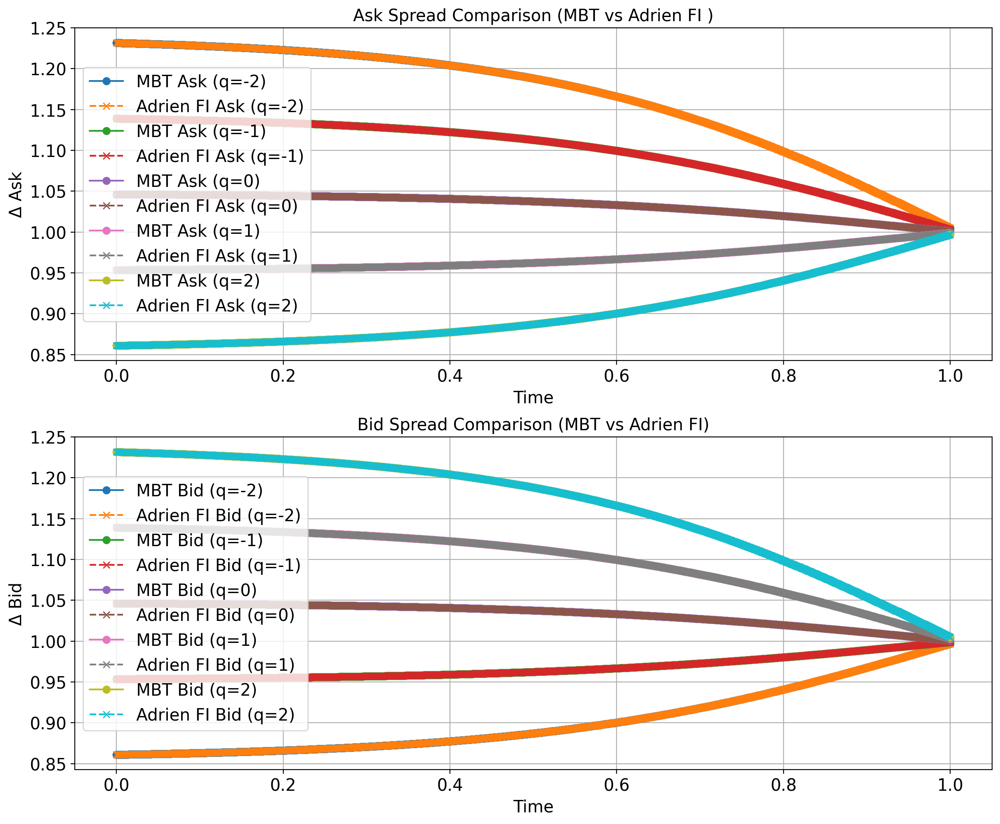

In [24]:

# Store values for plotting
times = []
q_values_all = []
mbt_asks = []
mbt_bids = []
adrien_FI_asks = []
adrien_FI_bids = []

print("-" * 60)
q_values = [-2, -1, 0, 1, 2]
#q_values = [-2]
ii = 0
u=0

for t in np.linspace(0, env.terminal_time, env.n_steps):
    for q in q_values:
        # === MBT spreads ===
        print(f"t={t:.5f}, q={q}")
        mbt_bid, mbt_ask  = agent_mbt._get_spreads_aux(t, inventory=q, u=u, ii=ii)
        
        # === Adrien FI spreads ===
        # Assuming the new method returns (ask_FI, bid_FI, ask_PI, bid_PI)
        Adrien_FI_ask, Adrien_FI_bid, _, _ = agent_Adrien.get_delta_fast(ii, q=q, u=u)

        # Store for plotting
        times.append(t)
        q_values_all.append(q)
        mbt_asks.append(mbt_ask)
        mbt_bids.append(mbt_bid)
        adrien_FI_asks.append(float(Adrien_FI_ask))
        adrien_FI_bids.append(float(Adrien_FI_bid))
    ii += 1


# === Plotting ===
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# --- Ask prices ---
plt.subplot(2, 1, 1)
for q in q_values:
    mask = [q_val == q for q_val in q_values_all]
    t_vals = [times[i] for i, m in enumerate(mask) if m]
    mbt_ask_vals = [mbt_asks[i] for i, m in enumerate(mask) if m]
    adrien_ask_vals = [adrien_FI_asks[i] for i, m in enumerate(mask) if m]
    
    plt.plot(t_vals, mbt_ask_vals, 'o-', label=f'MBT Ask (q={q})')
    plt.plot(t_vals, adrien_ask_vals, 'x--', label=f'Adrien FI Ask (q={q})')

plt.title('Ask Spread Comparison (MBT vs Adrien FI )')
plt.xlabel('Time')
plt.ylabel('Δ Ask')
plt.legend()
plt.grid(True)

# --- Bid prices ---
plt.subplot(2, 1, 2)
for q in q_values:
    mask = [q_val == q for q_val in q_values_all]
    t_vals = [times[i] for i, m in enumerate(mask) if m]
    mbt_bid_vals = [mbt_bids[i] for i, m in enumerate(mask) if m]
    adrien_bid_vals = [adrien_FI_bids[i] for i, m in enumerate(mask) if m]
    
    plt.plot(t_vals, mbt_bid_vals, 'o-', label=f'MBT Bid (q={q})')
    plt.plot(t_vals, adrien_bid_vals, 'x--', label=f'Adrien FI Bid (q={q})')

plt.title('Bid Spread Comparison (MBT vs Adrien FI)')
plt.xlabel('Time')
plt.ylabel('Δ Bid')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [25]:
t_test = env.terminal_time / 2
idx = int(np.argmin(np.abs(agent_Adrien.t_vector - t_test)))
t_eval = float(agent_Adrien.t_vector[idx])
print(f"Using t_eval≈{t_eval:.5f} (idx={idx}) closest to t_test={t_test:.5f}")

# Store values for plotting
times = []
q_values_all = []
u_values_all = []
mbt_asks = []
mbt_bids = []
adrien_FI_asks = []
adrien_FI_bids = []

print("-" * 60)
q_values = [-2, 0, 2]
ii = 0
u_values = [-0.5, 0, 0.5]

for t in np.linspace(0, env.terminal_time, env.n_steps):
    for q in q_values:
        for u in u_values:
            # === MBT spreads ===
            mbt_bid, mbt_ask  = agent_mbt._get_spreads_aux(t, inventory=q, u=u, ii=ii)
        
            # === Adrien FI spreads ===
            # Assuming the new method returns (ask_FI, bid_FI, ask_PI, bid_PI)
            Adrien_FI_ask, Adrien_FI_bid, _, _ = agent_Adrien.get_delta_fast(ii, q=q, u=u)

            # Store for plotting
            times.append(t)
            q_values_all.append(q)
            u_values_all.append(u)
            mbt_asks.append(mbt_ask)
            mbt_bids.append(mbt_bid)
            adrien_FI_asks.append(float(Adrien_FI_ask))
            adrien_FI_bids.append(float(Adrien_FI_bid))
    ii += 1


Using t_eval≈0.49950 (idx=499) closest to t_test=0.50000
------------------------------------------------------------
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: -0.5
MBT B: 0.2736892056120033
MBT inventory: -2
MBT h: 20.50564109018834 h_: 20.91834204174806 h__: 20.00026564133014
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 20.50568400706838 20.91838485932378 20.00030873942909
MBT A: -0.04633724864923867 b0: 0.0 b1: -0.5473784112240065 c0: 21.240028650369133 c1: 0.0 c2: -0.006640617439335365
MBT u: 0
MBT B: 0.0
MBT inventory: -2
MBT h: 21.05467965577218 h_: 21.193691401719896 h__: 20.822993412525985
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.82303667036819
MBT A: -0.04633724864923867 b

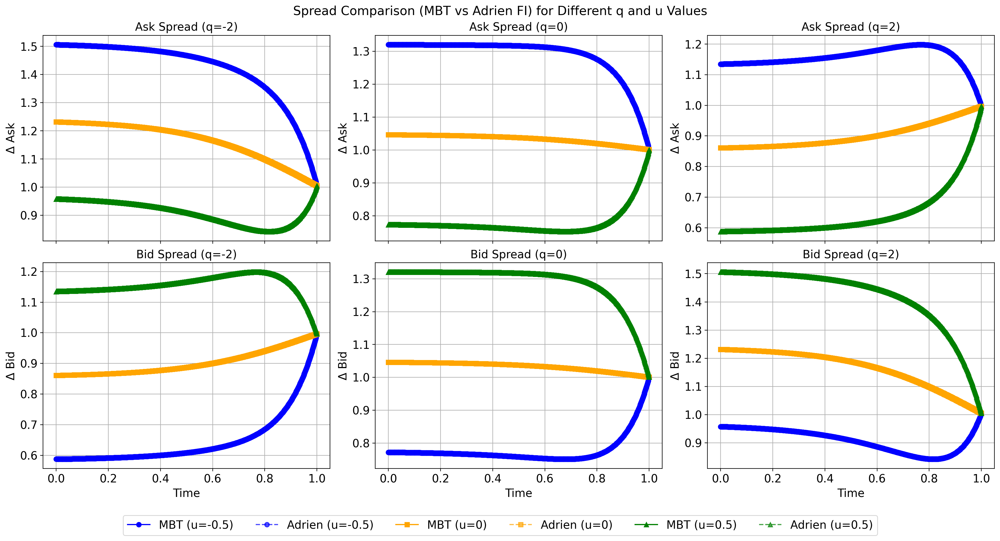

In [26]:
# === Plotting ===
import matplotlib.pyplot as plt

# Create a grid of subplots (2 rows for ask/bid, 3 columns for different q values)
fig, axes = plt.subplots(2, len(q_values), figsize=(18, 10), sharex=True)
fig.suptitle('Spread Comparison (MBT vs Adrien FI) for Different q and u Values', fontsize=16)

line_styles = ['-', '--', ':']
markers = ['o', 's', '^']
colors = ['blue', 'orange', 'green'] 

for i, q in enumerate(q_values):
    # --- Ask prices (top row) ---
    for j, u in enumerate(u_values):
        mask = [(q_val == q) & (u_val == u) for q_val, u_val in zip(q_values_all, u_values_all)]
        t_vals = [times[k] for k, m in enumerate(mask) if m]
        mbt_ask_vals = [mbt_asks[k] for k, m in enumerate(mask) if m]
        adrien_ask_vals = [adrien_FI_asks[k] for k, m in enumerate(mask) if m]
        
        axes[0, i].plot(t_vals, mbt_ask_vals, marker=markers[j], linestyle='-', 
                      color=colors[j], label=f'MBT (u={u})')
        axes[0, i].plot(t_vals, adrien_ask_vals, marker=markers[j], linestyle='--', 
                      color=colors[j], alpha=0.7, label=f'Adrien (u={u})')
    
    axes[0, i].set_title(f'Ask Spread (q={q})')
    axes[0, i].set_ylabel('Δ Ask')
    axes[0, i].grid(True)
    
    # --- Bid prices (bottom row) ---
    for j, u in enumerate(u_values):
        mask = [(q_val == q) & (u_val == u) for q_val, u_val in zip(q_values_all, u_values_all)]
        t_vals = [times[k] for k, m in enumerate(mask) if m]
        mbt_bid_vals = [mbt_bids[k] for k, m in enumerate(mask) if m]
        adrien_bid_vals = [adrien_FI_bids[k] for k, m in enumerate(mask) if m]
        
        axes[1, i].plot(t_vals, mbt_bid_vals, marker=markers[j], linestyle='-',
                      color=colors[j], label=f'MBT (u={u})')
        axes[1, i].plot(t_vals, adrien_bid_vals, marker=markers[j], linestyle='--',
                      color=colors[j], alpha=0.7, label=f'Adrien (u={u})')
    
    axes[1, i].set_title(f'Bid Spread (q={q})')
    axes[1, i].set_xlabel('Time')
    axes[1, i].set_ylabel('Δ Bid')
    axes[1, i].grid(True)

# Create a proper legend
handles, labels = [], []
for j, u in enumerate(u_values):
    # MBT line with solid linestyle
    handles.append(plt.Line2D([0], [0], marker=markers[j], linestyle='-', color=colors[j]))
    # Adrien line with dashed linestyle
    handles.append(plt.Line2D([0], [0], marker=markers[j], linestyle='--', color=colors[j], alpha=0.7))
    labels.extend([f'MBT (u={u})', f'Adrien (u={u})'])

fig.legend(handles, labels, loc='lower center', ncol=len(u_values)*2, bbox_to_anchor=(0.5, 0.02))

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for the legend
plt.show()

### Analysis of coefficients

#### Adrien agent

In [17]:
mm_qconst = {'q0': mm, 'q1': mm, 'q2':mm,'q3':mm,'q4':mm,'q5':mm}
PnL_table_FI = []
PnL_table_PI = []
PnL_table_CJ = []

PnL_table_FI_q = []
PnL_table_PI_q = []
PnL_table_CJ_q = []

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


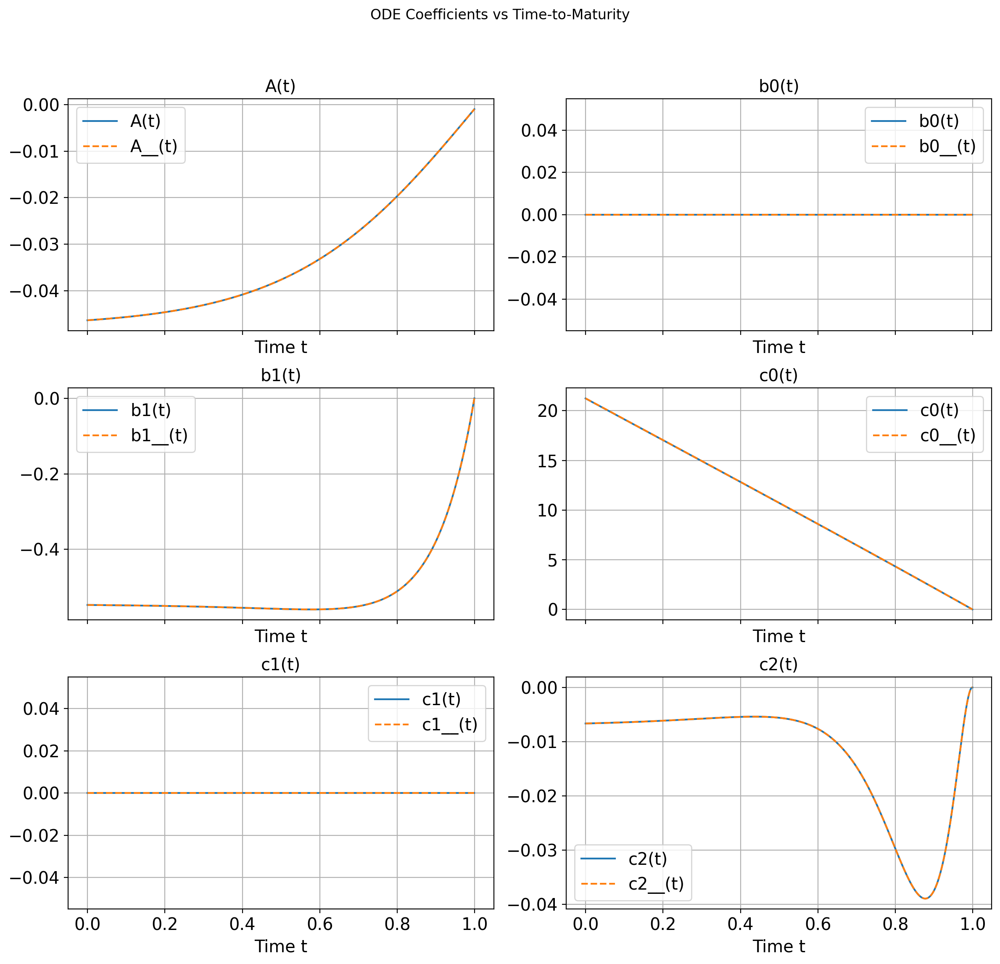

In [18]:
seed = 36457656
q_const_values = 0.6
params_env_cop = params_env.copy()
params_env_cop['N_t'] = 1000  # Number of time steps for the SB env
params_env_cop['matrixCJ'] = np.array(mm.get_delta_CJ_matrix())
for iq,const_value in enumerate([q_const_values]):
    params_aux = params_env_cop.copy()
    params_aux['qconst'] = const_value
    mm_aux = utils.mm_with_fads(**params_aux)
    mm_qconst[f'q{iq}'] = mm_aux
    mm_aux.plot_ODE_coefficients()
    np.random.seed(seed)

#### mbt gym agent

In [19]:
env = get_as_env(fads_proportion=fads_proportion, psi=psi, phi=phi, eta=eta, gamma=gamma, n_steps=1000)
agent_mbt = OptimizedFullInfoMMwithFadsInformedUniformedTradersAgent(env=env)

✓ Pre-computed ODE solutions for 1000 time points


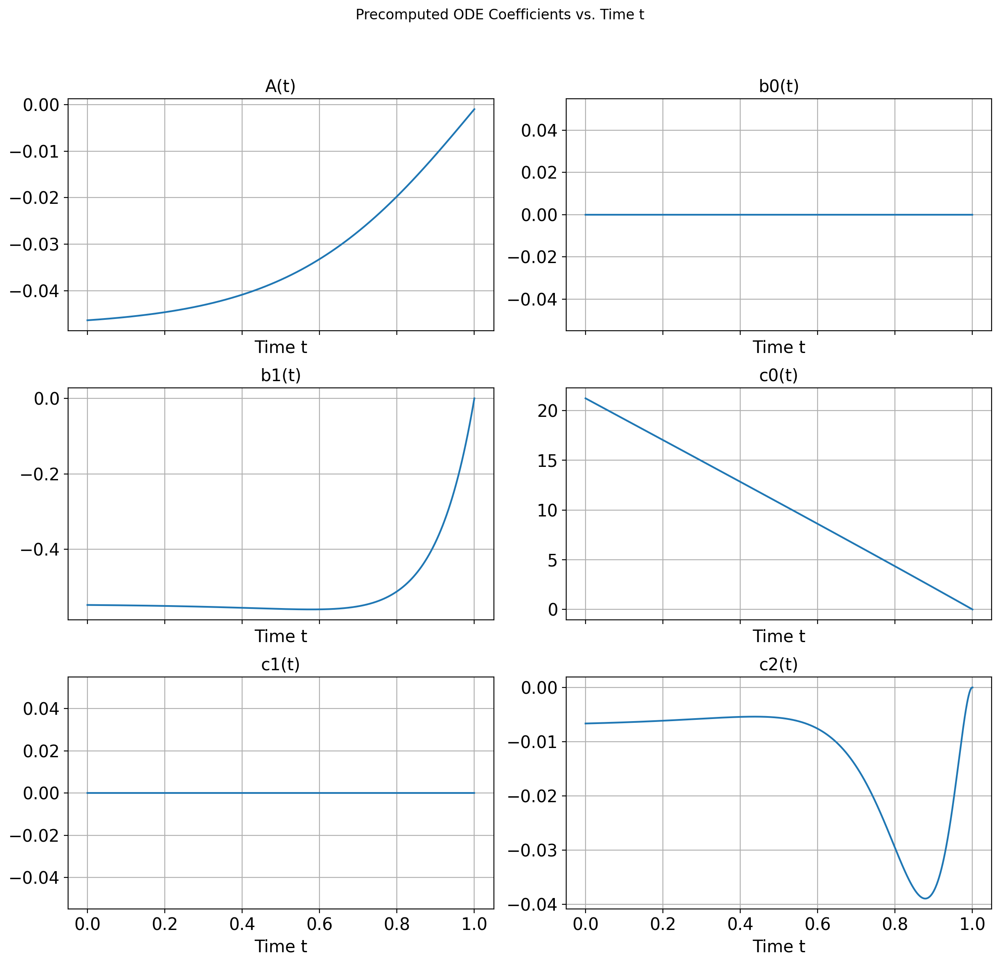

In [20]:
agent_mbt.plot_precomputed_solutions()